# BirdClef+ 2025 Data Visualization

## Import libraries

In [34]:
import os
import configparser
import random
import math
from pathlib import Path

import IPython.display as ipd
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
from scipy.interpolate import interp1d
import librosa

import warnings
warnings.filterwarnings('ignore')

In [2]:
pio.renderers.default = 'iframe'

## Config

In [3]:
config = configparser.ConfigParser()

In [4]:
config['project'] = {
    'name': 'birdclef_2025',
    'project_path': str(Path(os.getcwd()).parent)
}

config['data'] = {
    'data_path': config['project']['project_path'] + '/data',
    'birdclef_2025': config['project']['project_path'] + '/data/birdclef_2025',
}

## Load data

In [56]:
meta = pd.read_csv(config['data']['birdclef_2025'] + '/train.csv')
taxonomy = pd.read_csv(config['data']['birdclef_2025'] + '/taxonomy.csv')

## Taxonomy data

In [57]:
print(f"Total number of species in taxonomy data: {taxonomy.shape[0]}")

Total number of species in taxonomy data: 206


In [58]:
taxonomy.head()

,primary_label,inat_taxon_id,scientific_name,common_name,class_name
0,1139490,1139490,Ragoniella pulchella,Ragoniella pulchella,Insecta
1,1192948,1192948,Oxyprora surinamensis,Oxyprora surinamensis,Insecta
2,1194042,1194042,Copiphora colombiae,Copiphora colombiae,Insecta
3,126247,126247,Leptodactylus insularum,Spotted Foam-nest Frog,Amphibia
4,1346504,1346504,Neoconocephalus brachypterus,Neoconocephalus brachypterus,Insecta


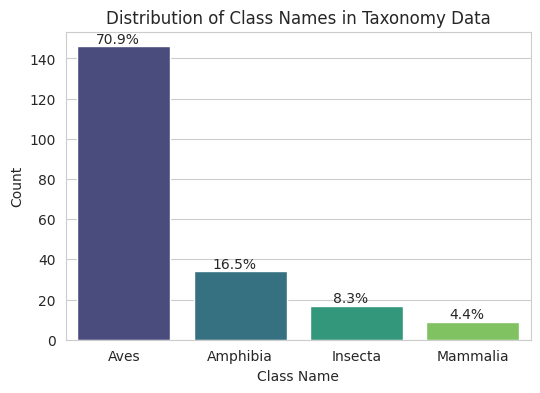

In [59]:
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=taxonomy, x='class_name', order=taxonomy['class_name'].value_counts().index,  palette='viridis')
plt.title('Distribution of Class Names in Taxonomy Data')
plt.xlabel('Class Name')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Calculate percentages
total = len(taxonomy)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom')


plt.show()

In [60]:
taxonomy["genus"] = taxonomy["scientific_name"].apply(lambda x: x.split(" ")[0])
taxonomy["species"] = taxonomy["scientific_name"].apply(lambda x: x.split(" ")[1] if len(x.split(" ")) > 1 else None)

In [64]:
taxonomy["genus"].value_counts()[0:10]

genus
Leptodactylus     4
Dendropsophus     4
Sporophila        4
Pristimantis      3
Chloroceryle      3
Ara               3
Elachistocleis    2
Rhinella          2
Boana             2
Thraupis          2
Name: count, dtype: int64

## Geological Distribution

In [9]:
species_dist = (meta
                .groupby(['primary_label','latitude', 'longitude'])
                .count()
                .reset_index()[['primary_label','scientific_name','latitude', 'longitude']]
                .rename(columns = {'scientific_name':'count'}))

meta_2 = meta.merge(species_dist, on = ['primary_label','latitude', 'longitude'], how = 'left').dropna(subset = ['count'])
meta_2['count'] = meta_2['count'].astype('int')

values_list = meta_2['count'].values.tolist()

interpolation = interp1d([1, max(values_list)], [4,20])
radius = interpolation(values_list)

fig = go.Figure(go.Densitymapbox(lat =meta_2['latitude'],lon = meta_2['longitude'], radius = radius,z = meta_2['count']))
fig.update_layout(mapbox_style="open-street-map", height=600,
                  mapbox={
                      'center': {'lat': 0,
                                 'lon': 0},
                      'zoom': 1.4
                  })
fig.show()

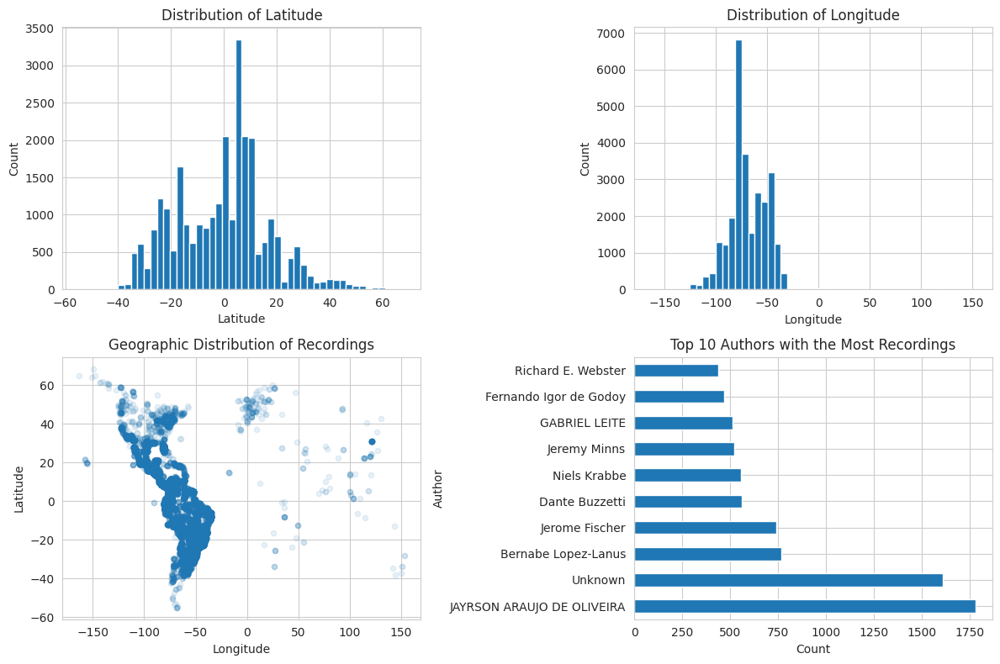

In [10]:
# Set up a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot a histogram of the latitude values
meta['latitude'].hist(bins=50, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of Latitude')
axs[0, 0].set_xlabel('Latitude')
axs[0, 0].set_ylabel('Count')
# Plot a histogram of the longitude values
meta['longitude'].hist(bins=50, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of Longitude')
axs[0, 1].set_xlabel('Longitude')
axs[0, 1].set_ylabel('Count')

# Plot a scatterplot of the latitude and longitude values
meta.plot.scatter(x='longitude', y='latitude', alpha=0.1, ax=axs[1, 0])
axs[1, 0].set_title('Geographic Distribution of Recordings')
axs[1, 0].set_xlabel('Longitude')
axs[1, 0].set_ylabel('Latitude')

# Print the top 10 authors with the most recordings
meta['author'].value_counts().nlargest(10).plot.barh(ax=axs[1, 1])
axs[1, 1].set_title('Top 10 Authors with the Most Recordings')
axs[1, 1].set_xlabel('Count')
axs[1, 1].set_ylabel('Author')

# Adjust the layout of the subplots
plt.tight_layout()

## Audio Visualization

In [35]:
meta.head()

,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
0,1139490,[''],[''],1139490/CSA36385.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
1,1139490,[''],[''],1139490/CSA36389.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
2,1192948,[''],[''],1192948/CSA36358.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
3,1192948,[''],[''],1192948/CSA36366.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.2800,-73.8582,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
4,1192948,[''],[''],1192948/CSA36373.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0


In [65]:
def visualize_audio(audio_path):
    """
    1. Prints audio metadata
    2. Plots the waveform
    3. Creates player

    Args:
        audio_path (str): Path to audio file
    """
    audio_signal, sample_rate = librosa.load(audio_path)

    print('%s Fs = %d, audio_signal.shape = %s, audio_signal.dtype = %s' % (f"OGG file: {'/'.join(audio_path.split('/')[-2:])}", sample_rate, audio_signal.shape, audio_signal.dtype))
    plt.figure(figsize=(8, 2))
    sns.lineplot(x=range(audio_signal.shape[0]), y=audio_signal, color='gray')
    plt.xlim([0, audio_signal.shape[0]])
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    ipd.display(ipd.Audio(data=audio_signal, rate=sample_rate))

OGG file: grekis/iNat958438.ogg Fs = 22050, audio_signal.shape = (516609,), audio_signal.dtype = float32


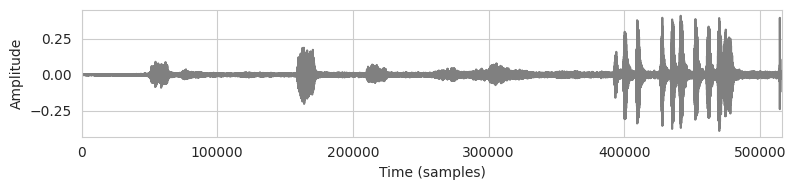

OGG file: butsal1/XC208954.ogg Fs = 22050, audio_signal.shape = (2413441,), audio_signal.dtype = float32


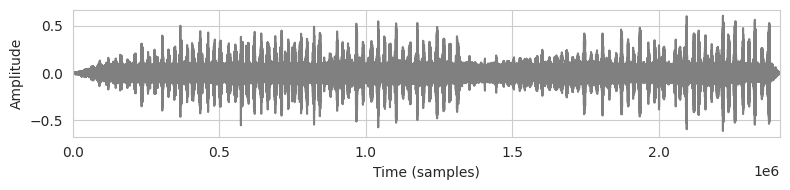

OGG file: snoegr/iNat707096.ogg Fs = 22050, audio_signal.shape = (302081,), audio_signal.dtype = float32


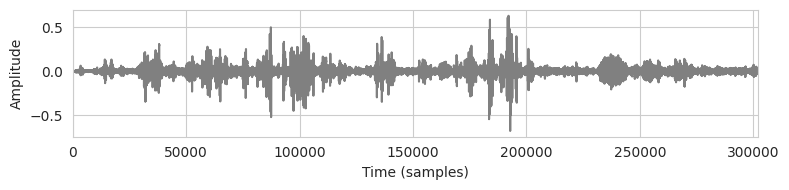

OGG file: bubcur1/XC45331.ogg Fs = 22050, audio_signal.shape = (1273537,), audio_signal.dtype = float32


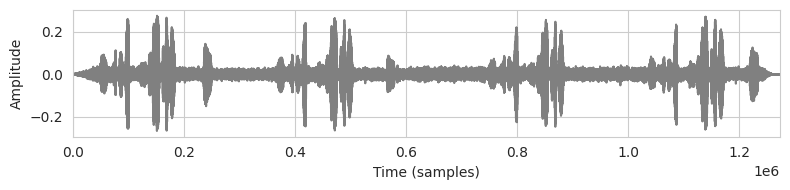

OGG file: amekes/iNat556970.ogg Fs = 22050, audio_signal.shape = (344444,), audio_signal.dtype = float32


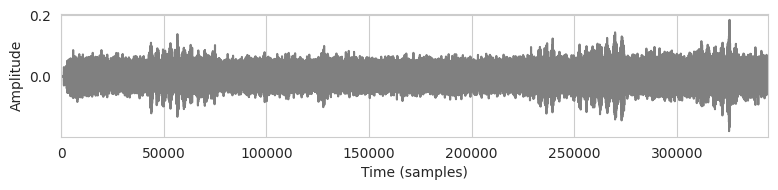

In [66]:
for i in random.sample(range(meta.shape[0]), 5):
    visualize_audio(config['data']['birdclef_2025'] + f'/train_audio/{meta["filename"][i]}')

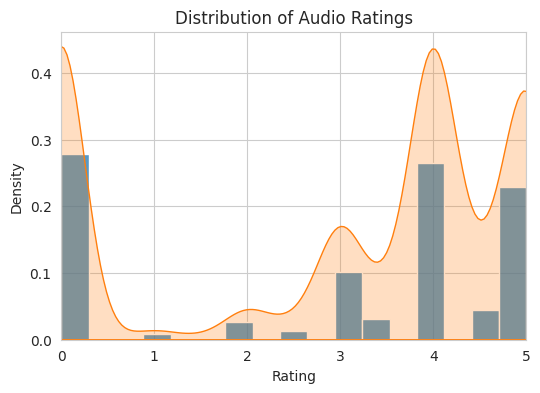

In [95]:
# plot the audio rating as kdensity plot
plt.figure(figsize=(6, 4))
sns.histplot(meta['rating'], kde=False, stat="probability",)
sns.kdeplot(meta['rating'], fill=True, palette='viridis')
plt.title('Distribution of Audio Ratings')
plt.xlim([0, 5])
plt.xlabel('Rating')
plt.ylabel('Density')
plt.show()